In [1]:
import numpy as np
import pandas as pd 
import tensorflow as tf
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import EarlyStopping, ReduceLROnPlateau
from keras.utils import to_categorical
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import random
import os
from zipfile import ZipFile

In [2]:
home_dir = '/Users/prometheus/' # change to your home directory here

# Download dataset

Downloaded from Kaggle: https://www.kaggle.com/competitions/dogs-vs-cats/data

I have then placed my data set in my directory ~/misc_datasets/

In [3]:

# specifying the zip file name
train_file = home_dir+"misc_datasets/dogs-vs-cats/train.zip"
test_file = home_dir+"misc_datasets/dogs-vs-cats/test1.zip"
files = [train_file, test_file]
for f in files:
    with ZipFile(f, 'r') as z:
        print('Extracting all the files for', f)
        z.extractall(path = home_dir+"misc_datasets/dogs-vs-cats")
        print('Done!')

Extracting all the files for /Users/prometheus/misc_datasets/dogs-vs-cats/train.zip
Done!
Extracting all the files for /Users/prometheus/misc_datasets/dogs-vs-cats/test1.zip
Done!


In [4]:
h = w = 128
img_size = (h, w)
channels = 3

In [5]:
filenames = os.listdir(home_dir+"misc_datasets/dogs-vs-cats/train/")
catdog = []
for f in filenames:
    cls = f.split('.')[0]
    if cls == 'dog':
        catdog.append(1)
    else:
        catdog.append(0)

df = pd.DataFrame({
    'filename': filenames,
    'class': catdog,
})

In [6]:
df.head()

,filename,class
0,dog.8011.jpg,1
1,cat.5077.jpg,0
2,dog.7322.jpg,1
3,cat.2718.jpg,0
4,cat.10151.jpg,0


In [7]:
df.shape

(25000, 2)

In [8]:
# now import my neural network models
from catdog_network import catdog_net1, catdog_net2

In [9]:
model = catdog_net1(h,w,channels,n_class=2, filter_size=(3,3))

Metal device set to: Apple M1


2022-09-26 18:57:41.338605: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2022-09-26 18:57:41.338697: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


In [10]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 126, 126, 32)      896       
                                                                 
 batch_normalization (BatchN  (None, 126, 126, 32)     128       
 ormalization)                                                   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 63, 63, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 61, 61, 64)        18496     
                                                                 
 batch_normalization_1 (Batc  (None, 61, 61, 64)       256       
 hNormalization)                                                 
                                                        

In [11]:
earlystop = EarlyStopping(patience=8) # stop training when validation accuracy is not improving for 8 epochs

In [12]:
learning_rate_reduction = ReduceLROnPlateau(monitor='val_accuracy', 
                                            patience=2, 
                                            verbose=1, 
                                            factor=0.5, 
                                            min_lr=0.00005)

# reduce learning rate by factor of 2 when validation acuracy does not improve for 2 epochs

In [13]:
callbacks = [earlystop, learning_rate_reduction] # set the callbacks

In [14]:
df["class"] = df["class"].replace({0: 'cat', 1: 'dog'}) # replace numeric class with category

In [15]:
train_df, validate_df = train_test_split(df, test_size=0.30, random_state=0) # 70/30 split seems fair for size
train_df = train_df.reset_index(drop=True)
validate_df = validate_df.reset_index(drop=True)

In [16]:
total_train = train_df.shape[0]
total_validate = validate_df.shape[0]
batch_size=32

In [17]:
# image augmentation
train_datagen = ImageDataGenerator(
    rotation_range=60,
    rescale=1./255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    width_shift_range=0.2,
    height_shift_range=0.2,
)

# image generator from df
train_generator = train_datagen.flow_from_dataframe(
    train_df, 
    home_dir+"misc_datasets/dogs-vs-cats/train", 
    x_col='filename',
    y_col='class',
    target_size= img_size,
    class_mode='categorical',
    batch_size=batch_size
)

Found 17500 validated image filenames belonging to 2 classes.


In [18]:
# validation generator from df
validation_datagen = ImageDataGenerator(rescale=1./255)
validation_generator = validation_datagen.flow_from_dataframe(
    validate_df, 
    home_dir+"misc_datasets/dogs-vs-cats/train",  
    x_col='filename',
    y_col='class',
    target_size=img_size,
    class_mode='categorical',
    batch_size=batch_size
)

Found 7500 validated image filenames belonging to 2 classes.


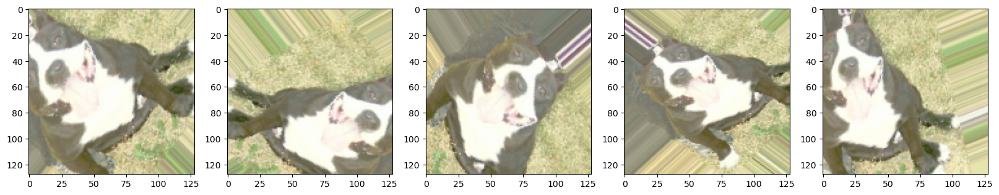

In [19]:
# visualize our generator and augmentation
fig, axes = plt.subplots(1, 5, figsize=(20,20))
axes = axes.flatten()
for ax in axes:
    ax.imshow(train_generator[0][0][0])

In [20]:
# train
epochs=50 
history = model.fit(
    train_generator, 
    epochs=epochs,
    validation_data=validation_generator,
    validation_steps=np.ceil(total_validate/batch_size),
    steps_per_epoch=np.ceil(total_train/batch_size),
    callbacks=callbacks
)

Epoch 1/50


2022-09-26 18:57:42.698533: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2022-09-26 18:57:43.239692: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


547/547 [==============================] - ETA: 0s - loss: 0.8237 - accuracy: 0.6039

2022-09-26 18:58:50.649689: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


547/547 [==============================] - 80s 144ms/step - loss: 0.8237 - accuracy: 0.6039 - val_loss: 0.9306 - val_accuracy: 0.5215 - lr: 0.0010
Epoch 2/50
547/547 [==============================] - 85s 156ms/step - loss: 0.5948 - accuracy: 0.6841 - val_loss: 0.5382 - val_accuracy: 0.7237 - lr: 0.0010
Epoch 3/50
547/547 [==============================] - 88s 160ms/step - loss: 0.5410 - accuracy: 0.7327 - val_loss: 0.7611 - val_accuracy: 0.6235 - lr: 0.0010
Epoch 4/50
547/547 [==============================] - 89s 162ms/step - loss: 0.4860 - accuracy: 0.7693 - val_loss: 0.4435 - val_accuracy: 0.8016 - lr: 0.0010
Epoch 5/50
547/547 [==============================] - 90s 164ms/step - loss: 0.4488 - accuracy: 0.7921 - val_loss: 0.4311 - val_accuracy: 0.8052 - lr: 0.0010
Epoch 6/50
547/547 [==============================] - 90s 165ms/step - loss: 0.4291 - accuracy: 0.8024 - val_loss: 0.3684 - val_accuracy: 0.8392 - lr: 0.0010
Epoch 7/50
547/547 [==============================] - 91s 167ms

Epoch 47/50
547/547 [==============================] - 77s 141ms/step - loss: 0.2328 - accuracy: 0.9045 - val_loss: 0.2053 - val_accuracy: 0.9149 - lr: 5.0000e-05


91% accuracy on validation set

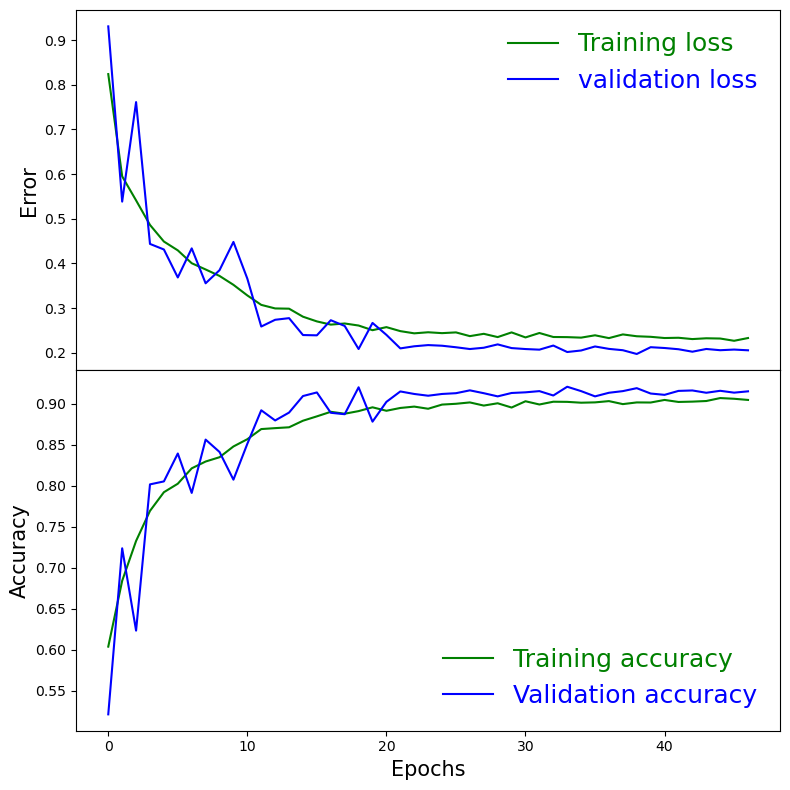

In [21]:
# plot loss and accuracy
gridspec_kw = dict(height_ratios=(1, 1), hspace=0)

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(8, 8), sharex=True, gridspec_kw=gridspec_kw)

ax1.plot(history.history['loss'], color='g', label="Training loss")
ax1.plot(history.history['val_loss'], color='b', label="validation loss")
ax1.set_ylabel('Error', fontsize = 15)
ax1.legend(loc='best', frameon = False, labelcolor = 'linecolor', fontsize = 18)

ax2.plot(history.history['accuracy'], color='g', label="Training accuracy")
ax2.plot(history.history['val_accuracy'], color='b',label="Validation accuracy")
ax2.set_xlabel('Epochs', fontsize = 15)
ax2.set_ylabel('Accuracy', fontsize = 15)
ax2.legend(loc='best', frameon = False, labelcolor = 'linecolor', fontsize = 18)

plt.tight_layout()
plt.show()

In [22]:
# check our model on the test data:
# get test dataset
test_files = os.listdir(home_dir+"misc_datasets/dogs-vs-cats/test1")

df_test = pd.DataFrame({
    'filename': test_files
})

In [23]:
df_test.head()

,filename
0,9733.jpg
1,63.jpg
2,6400.jpg
3,823.jpg
4,4217.jpg


In [24]:
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_dataframe(
    df_test, 
    home_dir+"misc_datasets/dogs-vs-cats/test1/",  
    x_col='filename',
    y_col = None,
    class_mode=None,
    shuffle=False,
    target_size=img_size,
    batch_size=batch_size)

Found 12500 validated image filenames.


In [25]:
test_size = df_test.shape[0]

In [26]:
# predict
predict = model.predict(test_generator, steps=np.ceil(test_size/batch_size))

  3/391 [..............................] - ETA: 17s 

2022-09-26 22:40:16.527267: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


391/391 [==============================] - 20s 51ms/step


In [27]:
# grab the largest probability and give it a class 0 or 1
df_test['class'] = np.argmax(predict, axis = 1)

In [28]:
df_test['class'] = df_test['class'].replace({0: 'cat', 1: 'dog'}) 

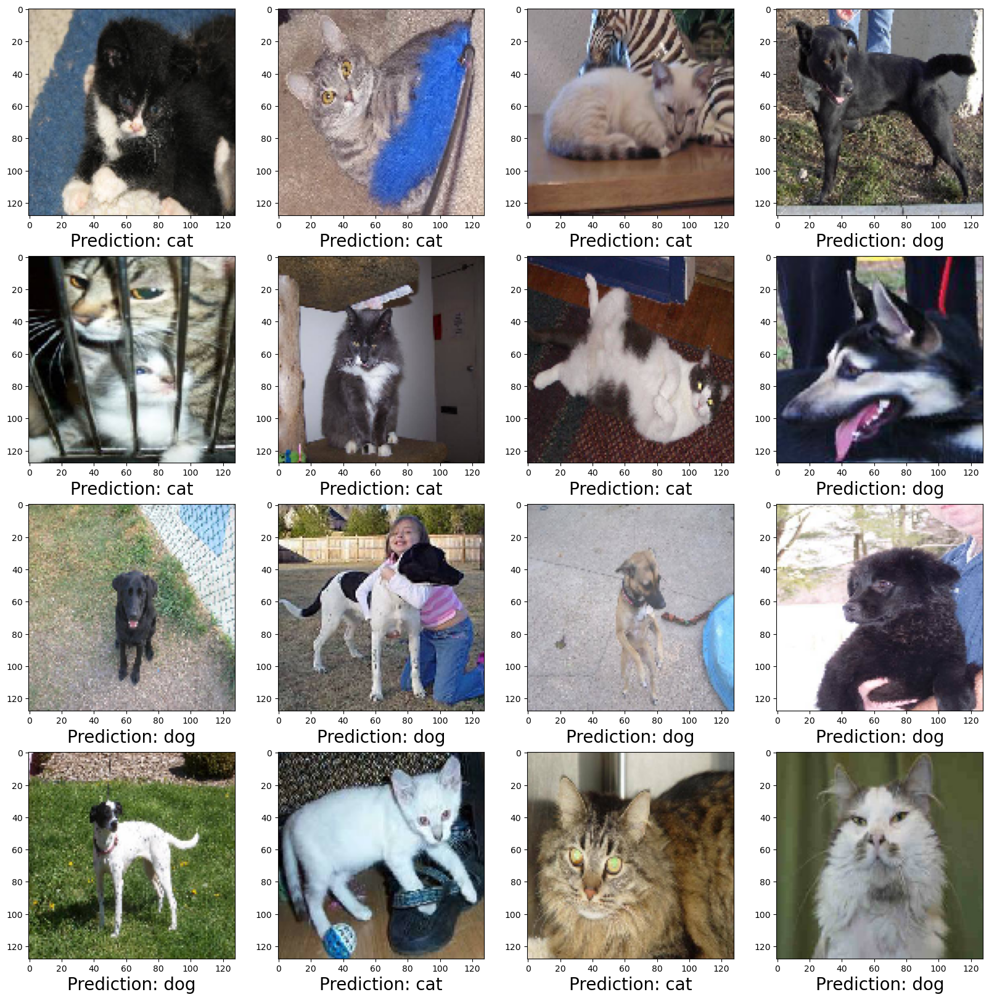

In [29]:
fig, ax = plt.subplots(4, 4, figsize = (20,20))
for i in range(4):
    for j in range(4):
        ax[i,j].imshow(test_generator[0][i + 4*j])
        ax[i,j].set_xlabel('Prediction: '+df_test['class'][i + 4*j], fontsize = 20)

# Try second model

In [30]:
model2 = catdog_net2(h,w,channels, n_class=2, filter_size=(3,3))

In [31]:
model2.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 128, 128, 16)      448       
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 128, 128, 16)      0         
                                                                 
 conv2d_5 (Conv2D)           (None, 128, 128, 32)      4640      
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 128, 128, 32)      0         
                                                                 
 batch_normalization_5 (Batc  (None, 128, 128, 32)     128       
 hNormalization)                                                 
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 64, 64, 32)       0         
 2D)                                                  

In [32]:
# train
epochs=50 
history = model2.fit(
    train_generator, 
    epochs=epochs,
    validation_data=validation_generator,
    validation_steps=np.ceil(total_validate/batch_size),
    steps_per_epoch=np.ceil(total_train/batch_size),
    callbacks=callbacks
)

Epoch 1/50


2022-09-26 22:40:39.682812: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


547/547 [==============================] - ETA: 0s - loss: 0.7632 - accuracy: 0.6119

2022-09-26 22:41:49.105109: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


547/547 [==============================] - 82s 149ms/step - loss: 0.7632 - accuracy: 0.6119 - val_loss: 0.6001 - val_accuracy: 0.6676 - lr: 0.0010
Epoch 2/50
547/547 [==============================] - 83s 151ms/step - loss: 0.6095 - accuracy: 0.6685 - val_loss: 0.6374 - val_accuracy: 0.6580 - lr: 0.0010
Epoch 3/50
547/547 [==============================] - 85s 155ms/step - loss: 0.5706 - accuracy: 0.7042 - val_loss: 0.5809 - val_accuracy: 0.6971 - lr: 0.0010
Epoch 4/50
547/547 [==============================] - 84s 154ms/step - loss: 0.5465 - accuracy: 0.7193 - val_loss: 0.5235 - val_accuracy: 0.7387 - lr: 0.0010
Epoch 5/50
547/547 [==============================] - 5507s 10s/step - loss: 0.5295 - accuracy: 0.7380 - val_loss: 0.5433 - val_accuracy: 0.7111 - lr: 0.0010
Epoch 6/50
547/547 [==============================] - 11086s 20s/step - loss: 0.5124 - accuracy: 0.7433 - val_loss: 0.4372 - val_accuracy: 0.7964 - lr: 0.0010
Epoch 7/50
547/547 [==============================] - 9867s 18

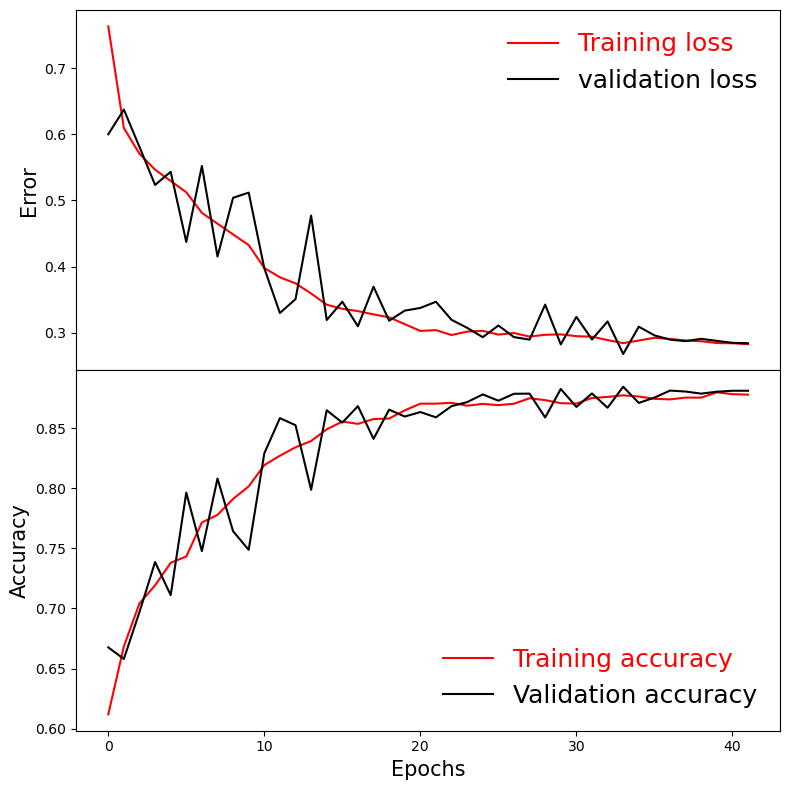

In [33]:
# plot loss and accuracy
gridspec_kw = dict(height_ratios=(1, 1), hspace=0)

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(8, 8), sharex=True, gridspec_kw=gridspec_kw)

ax1.plot(history.history['loss'], color='r', label="Training loss")
ax1.plot(history.history['val_loss'], color='k', label="validation loss")
ax1.set_ylabel('Error', fontsize = 15)
ax1.legend(loc='best', frameon = False, labelcolor = 'linecolor', fontsize = 18)

ax2.plot(history.history['accuracy'], color='r', label="Training accuracy")
ax2.plot(history.history['val_accuracy'], color='k',label="Validation accuracy")
ax2.set_xlabel('Epochs', fontsize = 15)
ax2.set_ylabel('Accuracy', fontsize = 15)
ax2.legend(loc='best', frameon = False, labelcolor = 'linecolor', fontsize = 18)

plt.tight_layout()
plt.show()

In [34]:
# predict
predict = model2.predict(test_generator, steps=np.ceil(test_size/batch_size))

  1/391 [..............................] - ETA: 1:27

2022-09-27 11:31:42.978824: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


391/391 [==============================] - 22s 56ms/step


In [35]:
# grab the largest probability and give it a class 0 or 1
df_test['class2.0'] = np.argmax(predict, axis = 1)
df_test['class2.0'] = df_test['class2.0'].replace({0: 'cat', 1: 'dog'}) 

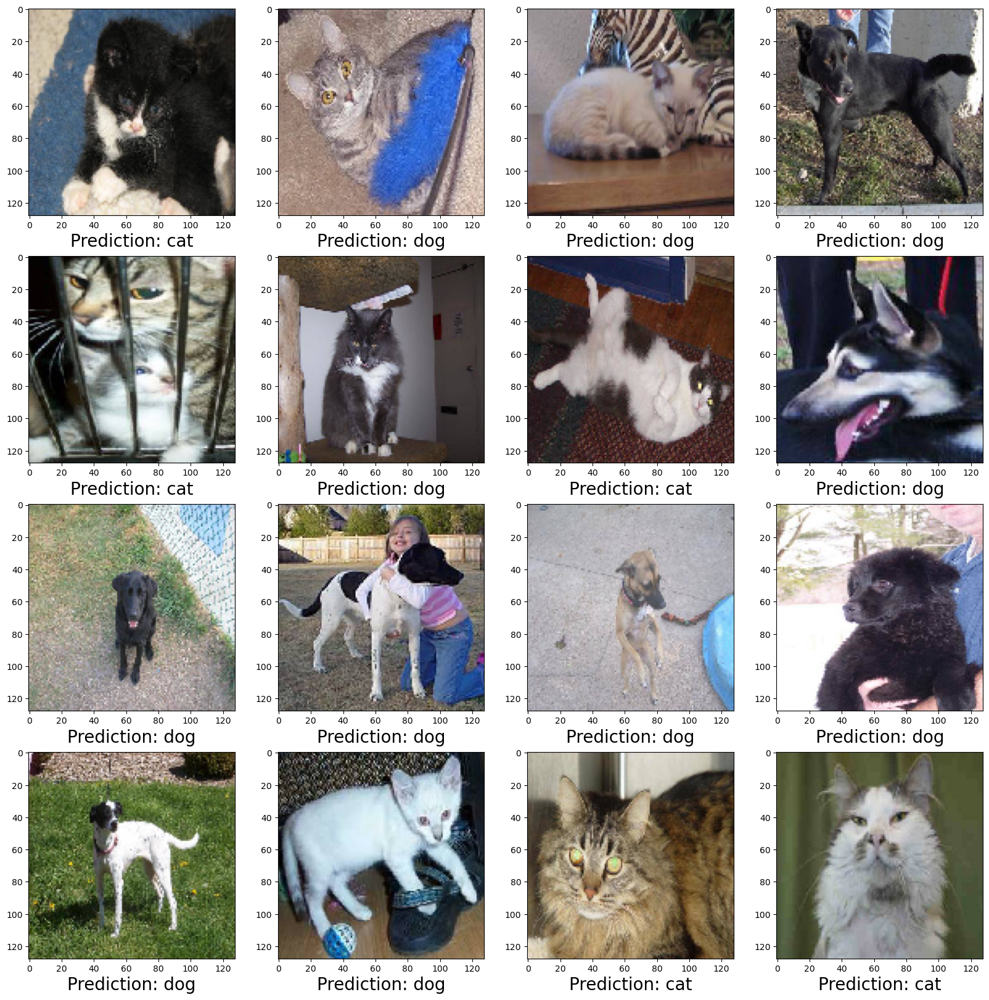

In [36]:
fig, ax = plt.subplots(4, 4, figsize = (20,20))
for i in range(4):
    for j in range(4):
        ax[i,j].imshow(test_generator[0][i + 4*j])
        ax[i,j].set_xlabel('Prediction: '+df_test['class2.0'][i + 4*j], fontsize = 20)

Model 1 structure seems to work a bit better.

# Try transfer learning

In [37]:
from catdog_network import transfer_model

In [38]:
h = w = 224. # MobileNet expects this size image

In [56]:
model3 = transfer_model(n_class=2)

In [57]:
model3.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_1 (KerasLayer)  (None, 1280)              2257984   
                                                                 
 dense_5 (Dense)             (None, 2)                 2562      
                                                                 
Total params: 2,260,546
Trainable params: 2,562
Non-trainable params: 2,257,984
_________________________________________________________________


In [58]:
# need to resize images 
# image generator from df
train_generator = train_datagen.flow_from_dataframe(
    train_df, 
    home_dir+"misc_datasets/dogs-vs-cats/train", 
    x_col='filename',
    y_col='class',
    target_size= (224,224),
    class_mode='categorical',
    batch_size=batch_size
)

validation_datagen = ImageDataGenerator(rescale=1./255)
validation_generator = validation_datagen.flow_from_dataframe(
    validate_df, 
    home_dir+"misc_datasets/dogs-vs-cats/train",  
    x_col='filename',
    y_col='class',
    target_size=(224,224),
    class_mode='categorical',
    batch_size=batch_size
)

Found 17500 validated image filenames belonging to 2 classes.
Found 7500 validated image filenames belonging to 2 classes.


In [59]:
epochs = 5 # transfer learning saves time and power, 5 iterations is enough here.
history = model3.fit(train_generator, 
                     epochs=epochs,
                     validation_data=validation_generator,
                     validation_steps=np.ceil(total_validate/batch_size),
                     steps_per_epoch=np.ceil(total_train/batch_size),
                     callbacks=callbacks
)

Epoch 1/5


2022-09-27 12:12:26.919722: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


547/547 [==============================] - ETA: 0s - loss: 0.1305 - accuracy: 0.9489

2022-09-27 12:32:56.614486: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


547/547 [==============================] - 1338s 2s/step - loss: 0.1305 - accuracy: 0.9489 - val_loss: 0.0429 - val_accuracy: 0.9863 - lr: 0.0010
Epoch 2/5
547/547 [==============================] - 370s 676ms/step - loss: 0.1009 - accuracy: 0.9607 - val_loss: 0.0487 - val_accuracy: 0.9839 - lr: 0.0010
Epoch 3/5
547/547 [==============================] - ETA: 0s - loss: 0.0968 - accuracy: 0.9623
Epoch 3: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
547/547 [==============================] - 378s 690ms/step - loss: 0.0968 - accuracy: 0.9623 - val_loss: 0.0423 - val_accuracy: 0.9863 - lr: 0.0010
Epoch 4/5
547/547 [==============================] - 377s 688ms/step - loss: 0.0901 - accuracy: 0.9645 - val_loss: 0.0452 - val_accuracy: 0.9851 - lr: 5.0000e-04
Epoch 5/5
547/547 [==============================] - ETA: 0s - loss: 0.0897 - accuracy: 0.9646
Epoch 5: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
547/547 [==============================] - 3

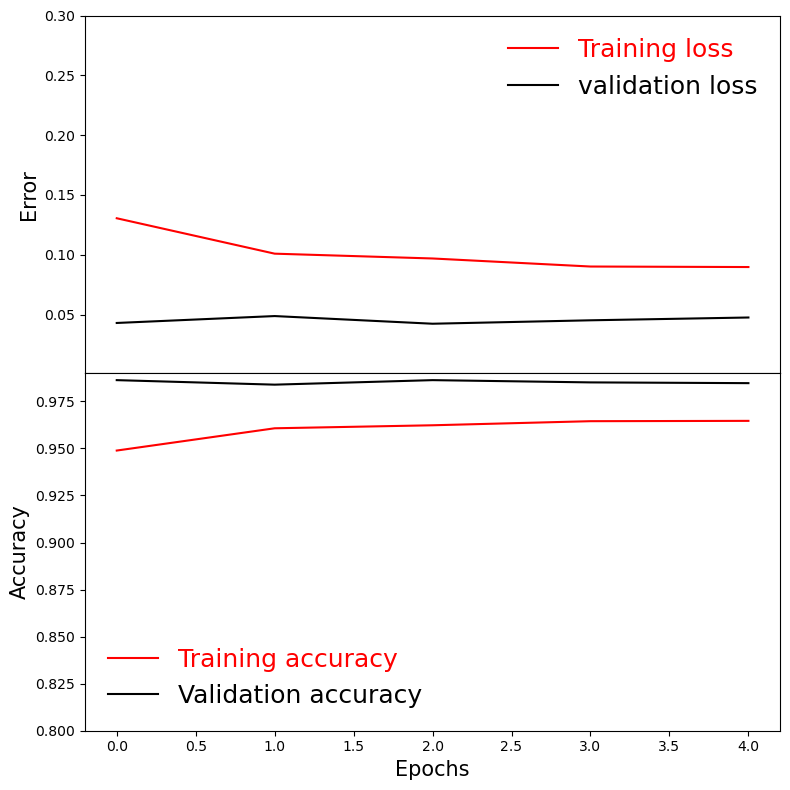

In [63]:
# plot loss and accuracy
gridspec_kw = dict(height_ratios=(1, 1), hspace=0)

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(8, 8), sharex=True, gridspec_kw=gridspec_kw)

ax1.plot(history.history['loss'], color='r', label="Training loss")
ax1.plot(history.history['val_loss'], color='k', label="validation loss")
ax1.set_ylabel('Error', fontsize = 15)
ax1.legend(loc='best', frameon = False, labelcolor = 'linecolor', fontsize = 18)
ax1.set_ylim(0.001,0.3)

ax2.plot(history.history['accuracy'], color='r', label="Training accuracy")
ax2.plot(history.history['val_accuracy'], color='k',label="Validation accuracy")
ax2.set_xlabel('Epochs', fontsize = 15)
ax2.set_ylabel('Accuracy', fontsize = 15)
ax2.legend(loc='best', frameon = False, labelcolor = 'linecolor', fontsize = 18)
ax2.set_ylim(0.8,0.99)
plt.tight_layout()
plt.show()

In [67]:
# resize test generator
test_generator = test_datagen.flow_from_dataframe(
    df_test, 
    home_dir+"misc_datasets/dogs-vs-cats/test1/",  
    x_col='filename',
    y_col = None,
    class_mode=None,
    shuffle=False,
    target_size=(224,224),
    batch_size=batch_size)

Found 12500 validated image filenames.


In [68]:
predict = model3.predict(test_generator, steps=np.ceil(test_size/batch_size))

391/391 [==============================] - 207s 528ms/step


In [69]:
# grab the largest probability and give it a class 0 or 1
df_test['class3.0'] = np.argmax(predict, axis = 1)
df_test['class3.0'] = df_test['class3.0'].replace({0: 'cat', 1: 'dog'}) 

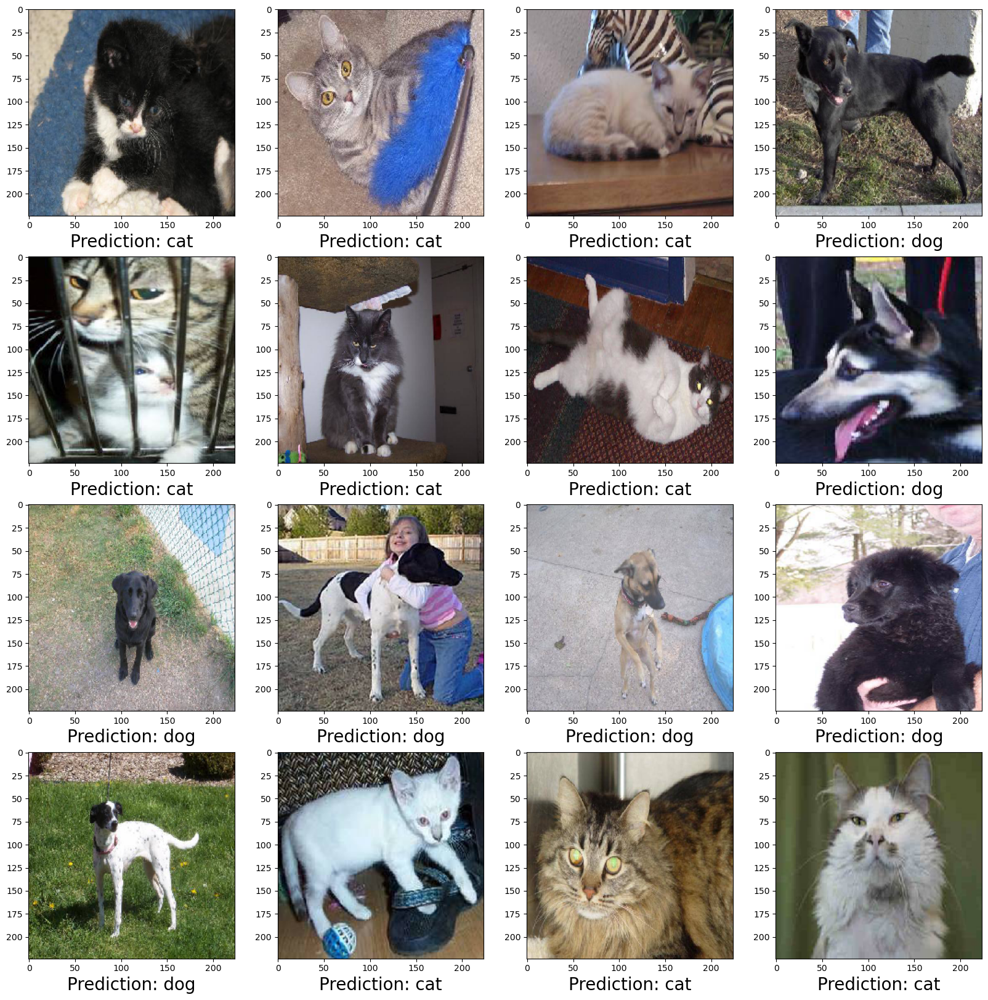

In [70]:
fig, ax = plt.subplots(4, 4, figsize = (20,20))
for i in range(4):
    for j in range(4):
        ax[i,j].imshow(test_generator[0][i + 4*j])
        ax[i,j].set_xlabel('Prediction: '+df_test['class3.0'][i + 4*j], fontsize = 20)

Using MobileNet's hidden layers gives incredibly accurate results. 